In [14]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from scipy.cluster.hierarchy import dendrogram, linkage
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.manifold import TSNE
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.util import ngrams
from nltk import pos_tag
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
import nltk
import re

warnings.filterwarnings('ignore')

plt.style.use('ggplot')
sns.set_theme(font_scale=1.2)
plt.rcParams['figure.figsize'] = (14, 10)

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\andras.janko\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\andras.janko\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\andras.janko\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\andras.janko\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\andras.janko\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


True

In [15]:
df_sample = pd.read_csv("_data/1_Fast_CrisisNLP_Twitter_Disaster/crisis_aggregated_preprocessed.csv")

# Create a smaller sample for computational efficiency in some analyses
# sample_size = min(300000, len(df))
# df_sample = df.sample(sample_size, random_state=42)

df_sample

,event,source,text,class_label,group,cleaned_text,normalized_text
0,disaster_events,drd-figureeight-multimedia,Approximately 100km long firebreaks have been ...,infrastructure_and_utilities_damage,train,approximately km long firebreaks have been con...,approximately km long firebreak constructed in...
1,2015_nepal_earthquake,crisisnlp-volunteers,God bless you... https://t.co/AnEy1ydkkz,not_humanitarian,train,god bless you,god bless
2,2014_california_earthquake,crisisnlp-cf,"RT @perreaux: Cracked wine casks, damaged hist...",infrastructure_and_utilities_damage,train,cracked wine casks damaged historical building...,cracked wine cask damaged historical building ...
3,2013_boston_bombings-ontopic,crisislext6,I'm really just excited for new undies and pin...,not_humanitarian,train,i m really just excited for new undies and pin...,really excited new undies pinkberry
4,2014_pakistan_floods,crisisnlp-cf,"Rescue effort expands in India, Pakistan as fl...",injured_or_dead_people,train,rescue effort expands in india pakistan as flo...,rescue effort expands india pakistan flood dea...
...,...,...,...,...,...,...,...
87450,2014_pakistan_floods,crisisnlp-cf,RT @Donkeyji: Ex Australian PM Kevin Rudd help...,donation_and_volunteering,test,ex australian pm kevin rudd helping flood vict...,ex australian pm kevin rudd helping flood vict...
87451,hurricane_maria,crisismmd,RT @CARICOMorg: #HurricaneMaria could cost Dom...,infrastructure_and_utilities_damage,test,hurricanemaria could cost dominica billions of...,hurricanemaria could cost dominica billion dol...
87452,2014_chile_earthquake,crisisnlp-cf,8.2 quake in Chile and there's a likely chance...,sympathy_and_support,test,quake in chile and there s a likely chance of ...,quake chile likely chance tsunami omg prayforc...
87453,disaster_events,drd-figureeight-multimedia,The provision of water purification systems an...,requests_or_needs,test,the provision of water purification systems an...,provision water purification system well clean...


In [16]:
df_sample['class_label'].unique()

array(['infrastructure_and_utilities_damage', 'not_humanitarian',
       'injured_or_dead_people', 'sympathy_and_support',
       'donation_and_volunteering', 'response_efforts',
       'caution_and_advice', 'requests_or_needs', 'affected_individual',
       'displaced_and_evacuations', 'missing_and_found_people'],
      dtype=object)

In [17]:
text_field_to_analyze = 'normalized_text'
category_field = 'class_label'

def tokenize_processed_text(text):
    if not isinstance(text, str):
        return []

    tokens = text.split()
    return tokens

df_sample['tokens'] = df_sample[text_field_to_analyze].apply(tokenize_processed_text)

# 1. VOCABULARY ANALYSIS


1. VOCABULARY ANALYSIS

1.1 Word frequency distributions

Top 30 most frequent words across all documents:
  nepal: 6096
  earthquake: 5254
  help: 5226
  people: 4975
  amp: 4291
  u: 4235
  need: 3290
  rubyph: 3273
  like: 3119
  flood: 3026
  please: 2957
  hurricane: 2905
  typhoon: 2602
  get: 2580
  go: 2494
  philippine: 2492
  food: 2466
  one: 2424
  day: 2368
  water: 2355
  victim: 2255
  harvey: 2191
  good: 2103
  relief: 2071
  irma: 2061
  news: 2020
  time: 2017
  know: 1962
  love: 1886
  hagupit: 1866


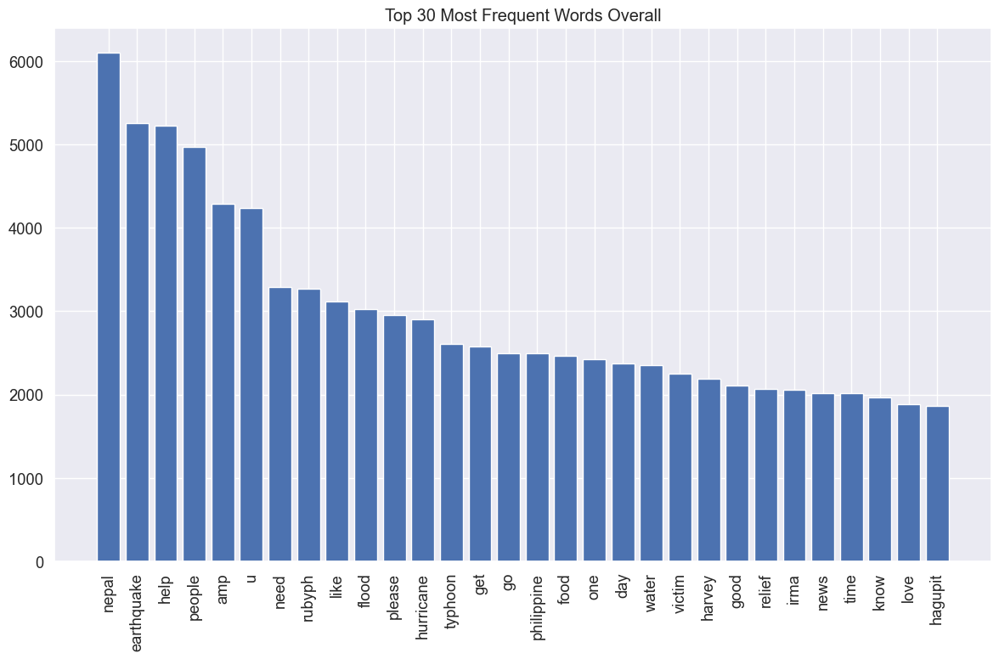


1.2 Class-specific vocabulary overlap

Vocabulary overlap between top classes:
                                    infrastructure_and_utilities_damage  \
infrastructure_and_utilities_damage                                 1.0   
not_humanitarian                                               0.186395   
injured_or_dead_people                                         0.305411   
sympathy_and_support                                           0.332567   
donation_and_volunteering                                      0.362275   
response_efforts                                               0.161926   
caution_and_advice                                             0.378937   
requests_or_needs                                              0.327278   
affected_individual                                            0.380642   
displaced_and_evacuations                                      0.103565   
missing_and_found_people                                       0.099267   

                   

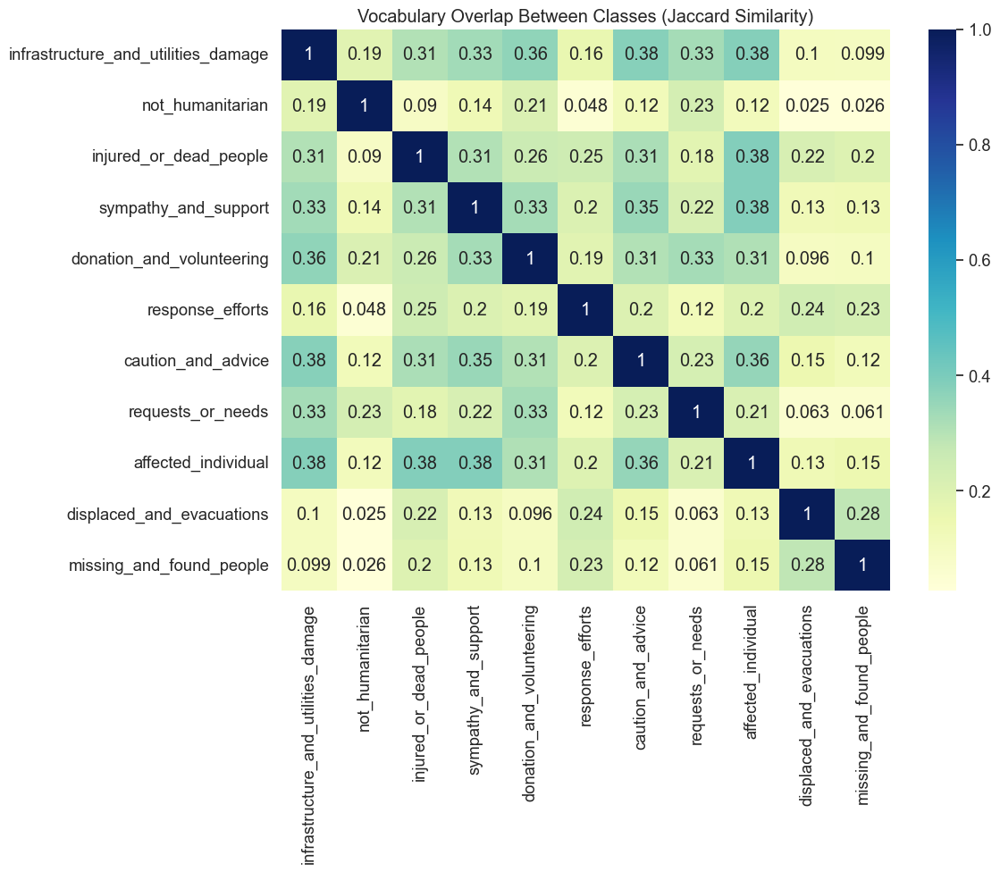


1.3 Unique word counts per class
  infrastructure_and_utilities_damage: 122 unique words
    Examples: damaging, structural, dairy, dike, inspect, threaten, assesses, hampered, generating, partially
  not_humanitarian: 4682 unique words
    Examples: waterfall, oc, sorted, absence, skull, parked, institute, kissed, hip, yah
  injured_or_dead_people: 25 unique words
    Examples: submerge, hindustan, inmate, world_latest, displace, superstorm, crane, suryaray, unconfirmed, ndtv
  sympathy_and_support: 39 unique words
    Examples: fuerzanortedechile, prayforcolorado, terremotoenchile, prayforboholandcebu, prayforcabo, prayforukraine, prayformh, p_, mourns, prayforbrazil
  donation_and_volunteering: 121 unique words
    Examples: iranian, puig, pakarmy, balochistanearthquake, oakland, bsnl, unitas, refused, crore, omgp
  response_efforts: 0 unique words
  caution_and_advice: 40 unique words
    Examples: subsided, hazardous, qldflood, unhealthy, feu, sendong, inwx, txwx, advises, ncr
  

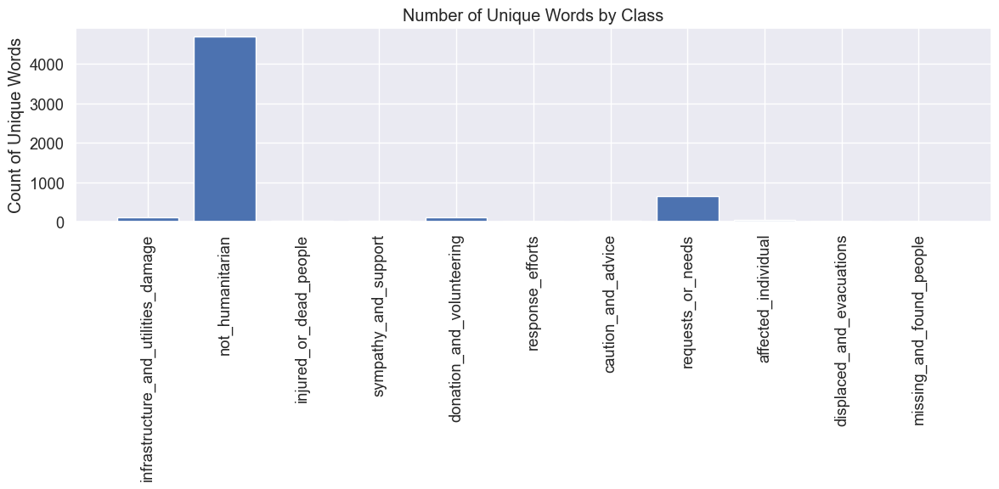

In [18]:
print("\n" + "="*80)
print("1. VOCABULARY ANALYSIS")
print("="*80)

print("\n1.1 Word frequency distributions")

# Function to get word frequency
def get_word_freq(tokens_list, top_n=30):
    all_words = [word for tokens in tokens_list for word in tokens]
    word_freq = Counter(all_words)
    return word_freq.most_common(top_n)

# Get overall word frequency
overall_word_freq = get_word_freq(df_sample['tokens'])
print("\nTop 30 most frequent words across all documents:")
for word, count in overall_word_freq:
    print(f"  {word}: {count}")

# Visualize overall word frequency
plt.figure(figsize=(12, 8))
words, counts = zip(*overall_word_freq)
plt.bar(words, counts)
plt.xticks(rotation=90)
plt.title('Top 30 Most Frequent Words Overall')
plt.tight_layout()
plt.show()
plt.close()

print("\n1.2 Class-specific vocabulary overlap")

# Function to get class-specific vocabulary
def get_class_vocab(df, class_name, min_freq=5):
    # Get documents for this class
    class_docs = df[df[category_field] == class_name][text_field_to_analyze]

    # Tokenize the processed text
    tokenized_docs = class_docs.apply(tokenize_processed_text)

    # Flatten tokens from all documents
    all_words = [word for tokens in tokenized_docs for word in tokens]

    # Filter by minimum frequency to reduce noise
    word_freq = Counter(all_words)
    vocab = {word for word, count in word_freq.items() if count >= min_freq}

    return vocab

# Get vocabulary for each top class
top_classes = df_sample[category_field].unique()
class_vocabularies = {cls: get_class_vocab(df_sample, cls) for cls in top_classes}

# Calculate vocabulary overlap between classes
print("\nVocabulary overlap between top classes:")
overlap_matrix = pd.DataFrame(index=top_classes, columns=top_classes)

for cls1 in top_classes:
    for cls2 in top_classes:
        vocab1 = class_vocabularies[cls1]
        vocab2 = class_vocabularies[cls2]

        if len(vocab1) == 0 or len(vocab2) == 0:
            overlap = 0
        else:
            # Jaccard similarity
            overlap = len(vocab1.intersection(vocab2)) / len(vocab1.union(vocab2))

        overlap_matrix.loc[cls1, cls2] = overlap

print(overlap_matrix)

# Visualize vocabulary overlap with a heatmap
plt.figure(figsize=(12, 10))
overlap_matrix_float = overlap_matrix.astype(float)
sns.heatmap(overlap_matrix_float, annot=True, cmap='YlGnBu')
plt.title('Vocabulary Overlap Between Classes (Jaccard Similarity)')
plt.tight_layout()
plt.show()
plt.close()

print("\n1.3 Unique word counts per class")

# Calculate unique word counts
unique_word_counts = {}
for cls in top_classes:
    class_vocab = class_vocabularies[cls]

    # Find words unique to this class
    unique_words = set(class_vocab)
    for other_cls in top_classes:
        if other_cls != cls:
            unique_words -= class_vocabularies[other_cls]

    unique_word_counts[cls] = len(unique_words)
    print(f"  {cls}: {len(unique_words)} unique words")
    # Print some examples of unique words
    unique_word_list = list(unique_words)[:10]  # Show up to 10 examples
    if unique_word_list:
        print(f"    Examples: {', '.join(unique_word_list)}")

# Visualize unique word counts
plt.figure(figsize=(12, 6))
plt.bar(unique_word_counts.keys(), unique_word_counts.values())
plt.xticks(rotation=90)
plt.title('Number of Unique Words by Class')
plt.ylabel('Count of Unique Words')
plt.tight_layout()
plt.show()
plt.close()

# 2. TEXT VISUALIZATION


2. TEXT VISUALIZATION

2.1 Word clouds for each class


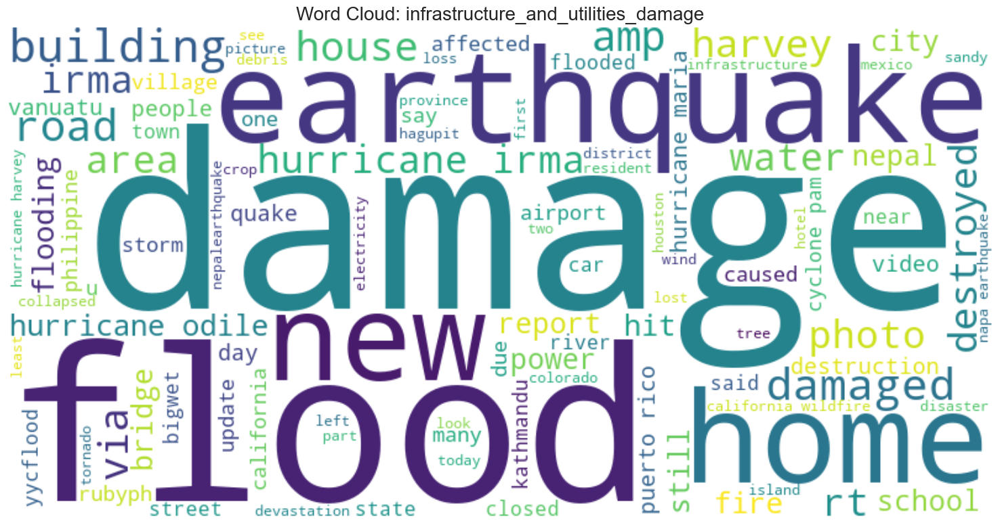

  Created word cloud for infrastructure_and_utilities_damage


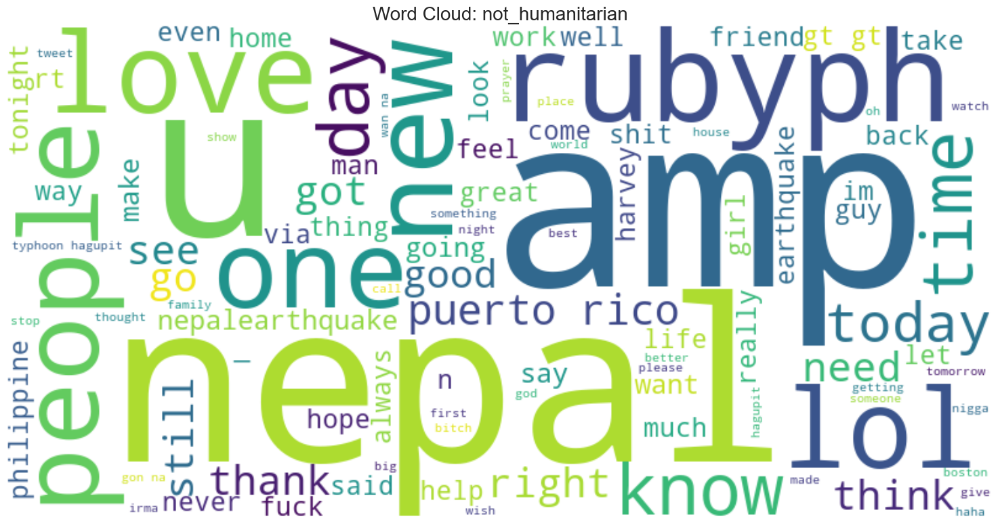

  Created word cloud for not_humanitarian


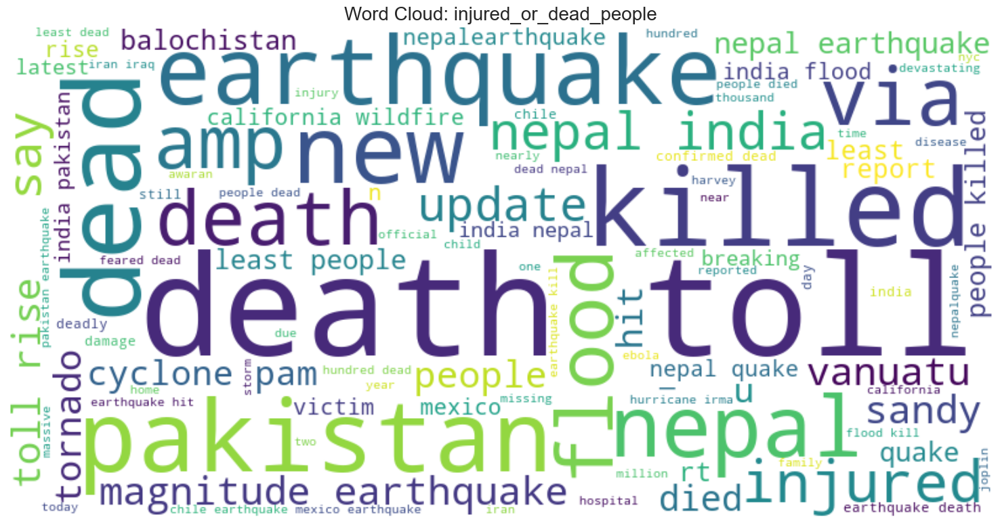

  Created word cloud for injured_or_dead_people


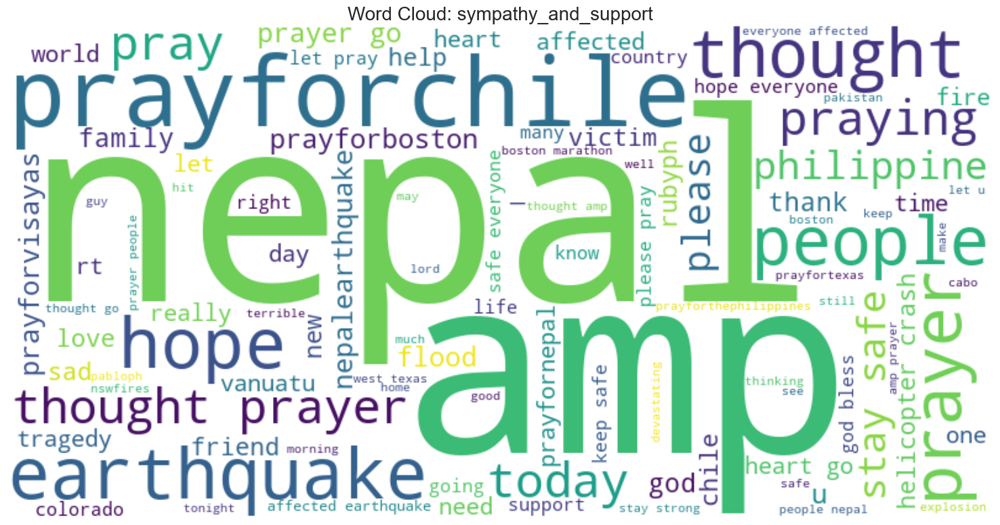

  Created word cloud for sympathy_and_support


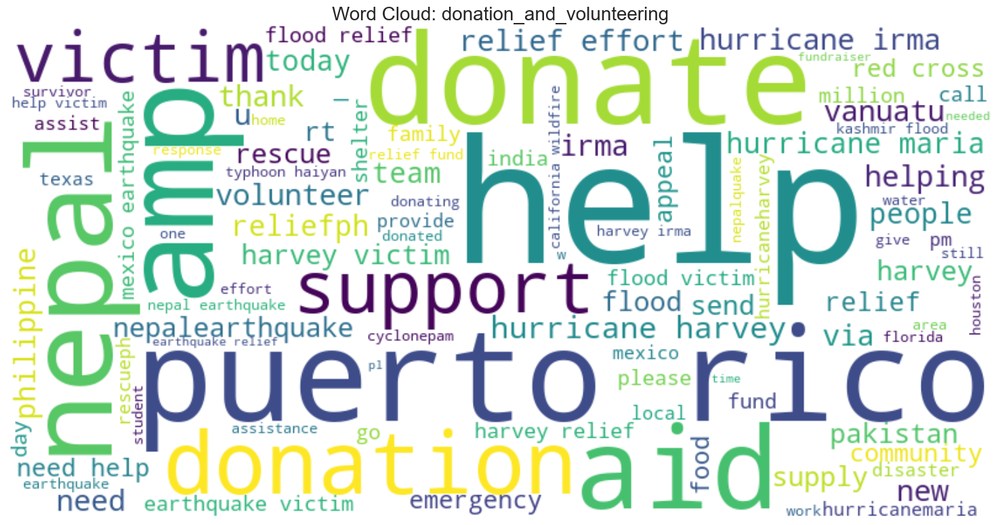

  Created word cloud for donation_and_volunteering


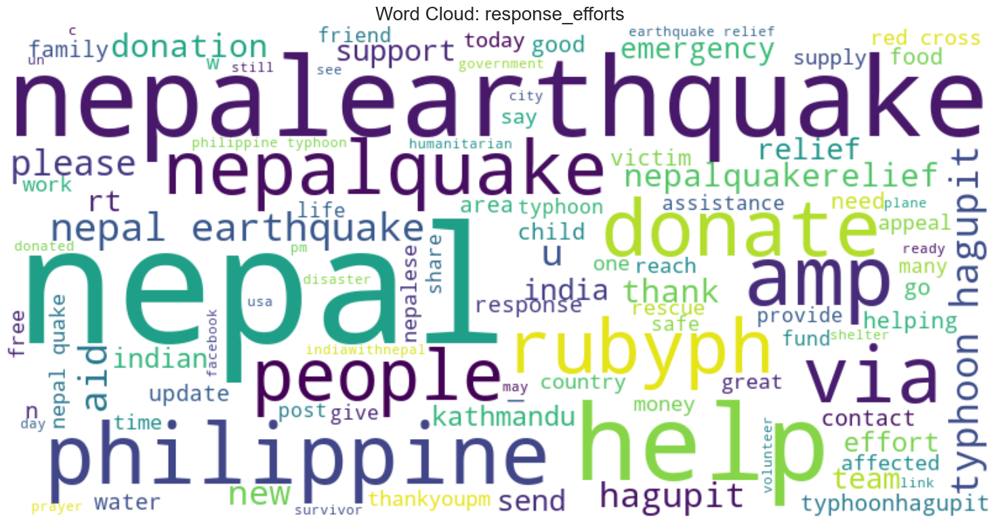

  Created word cloud for response_efforts


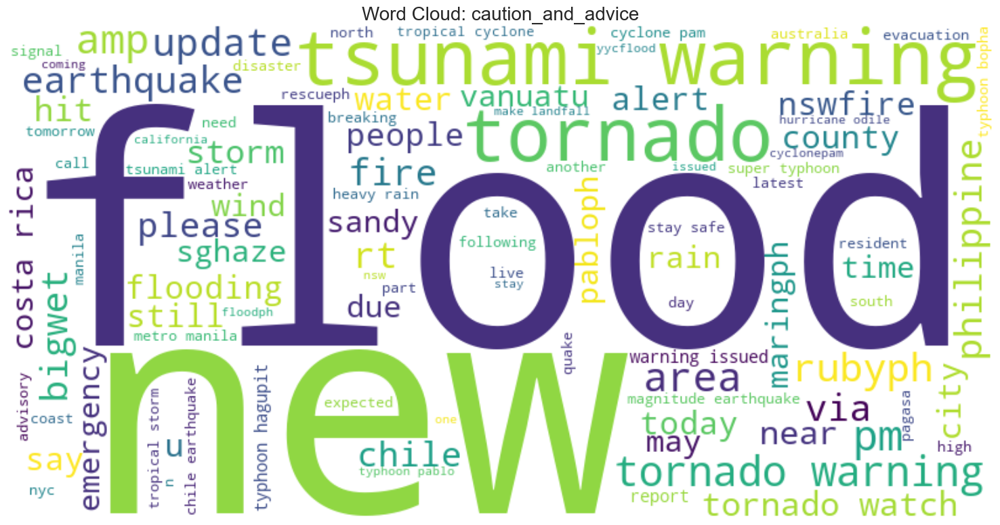

  Created word cloud for caution_and_advice


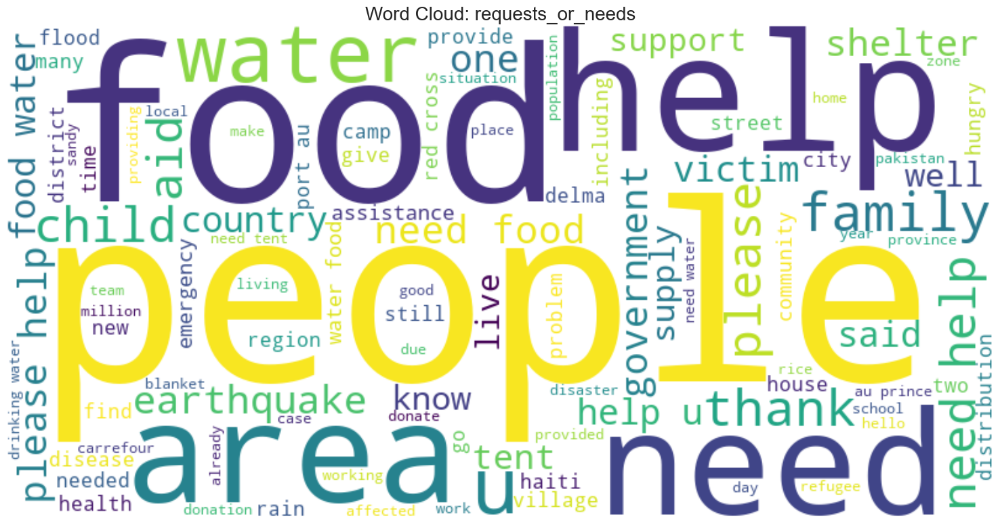

  Created word cloud for requests_or_needs


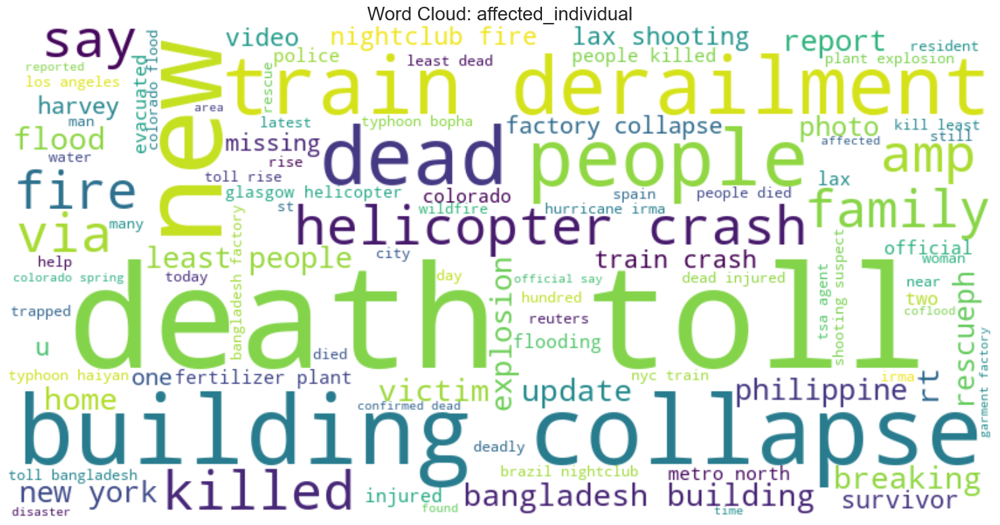

  Created word cloud for affected_individual


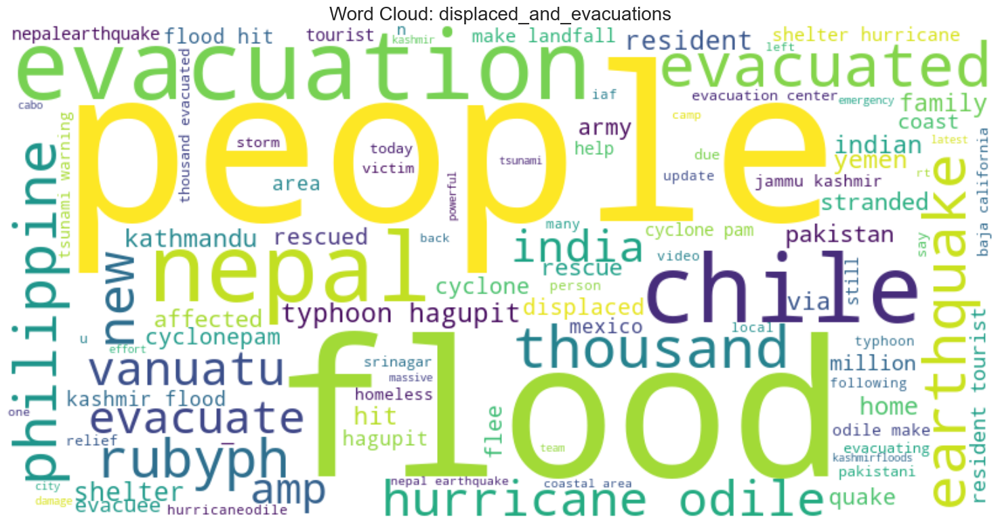

  Created word cloud for displaced_and_evacuations


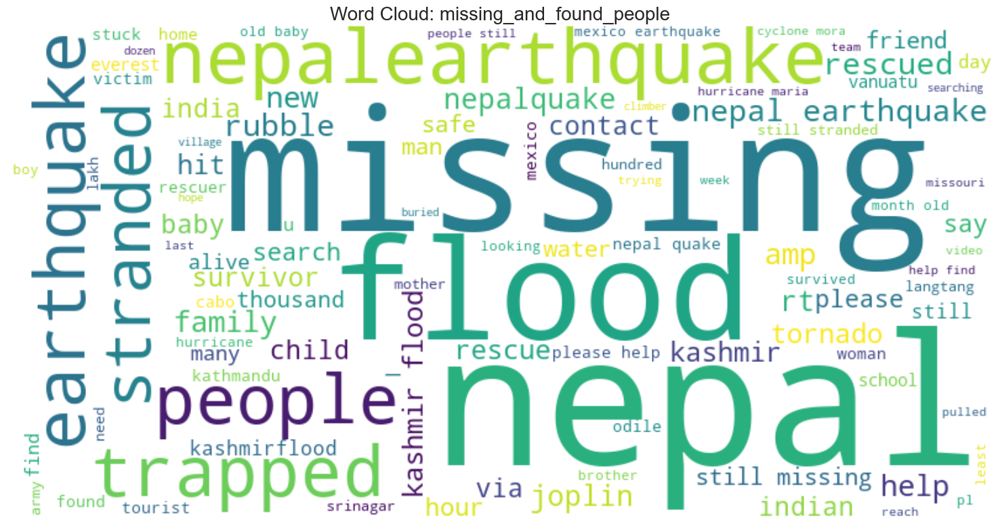

  Created word cloud for missing_and_found_people

2.2 n-gram frequency charts

Top 20 most frequent bigrams:
  puerto rico: 1772
  death toll: 921
  typhoon hagupit: 692
  hurricane irma: 626
  hurricane maria: 571
  stay safe: 570
  nepal earthquake: 570
  gt gt: 537
  need help: 520
  hurricane harvey: 494
  gon na: 454
  please help: 411
  keep safe: 394
  wan na: 376
  god bless: 357
  california wildfire: 356
  help u: 345
  new york: 344
  red cross: 334
  hurricane odile: 334

Top 20 most frequent trigrams:
  gt gt gt: 297
  lt lt lt: 160
  keep safe everyone: 146
  death toll rise: 143
  port au prince: 120
  please help u: 119
  bangladesh building collapse: 110
  stay safe everyone: 109
  need food water: 104
  glasgow helicopter crash: 93
  helicopter crash glasgow: 80
  cabo san lucas: 72
  help puerto rico: 66
  safe everyone rubyph: 64
  would like know: 62
  thought amp prayer: 62
  brazil nightclub fire: 61
  earthquake death toll: 61
  money irma business: 60
  though

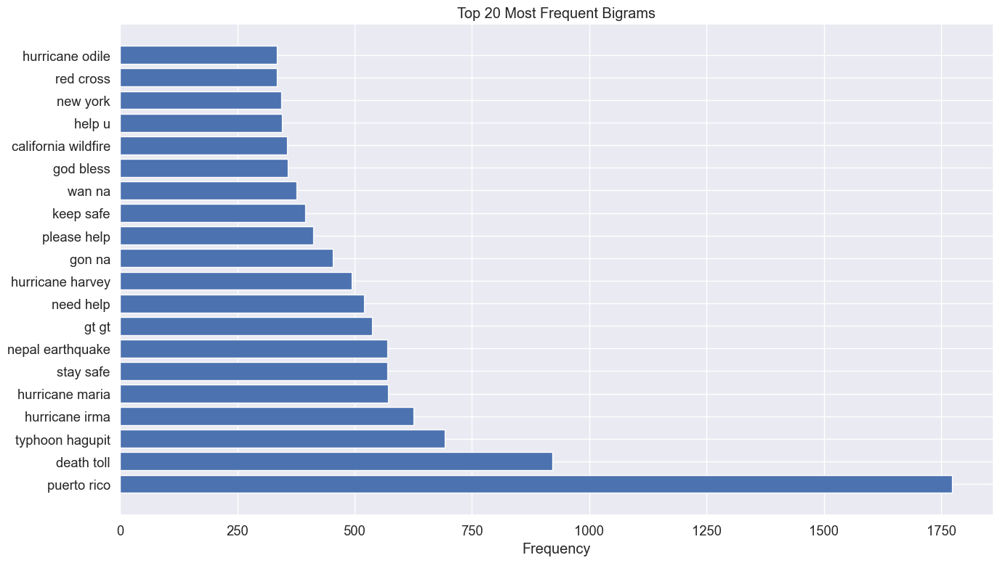

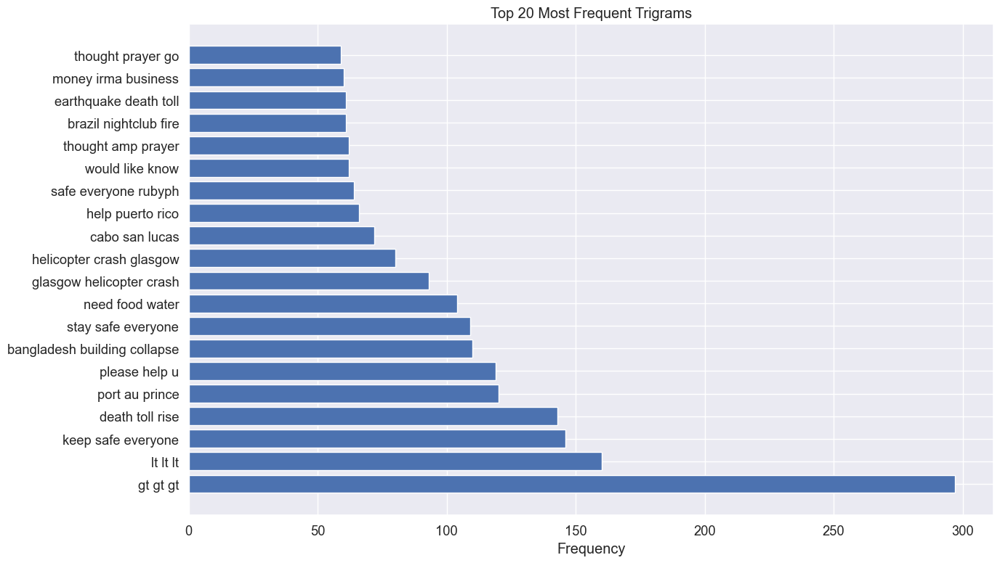


2.3 Distribution of text lengths by class


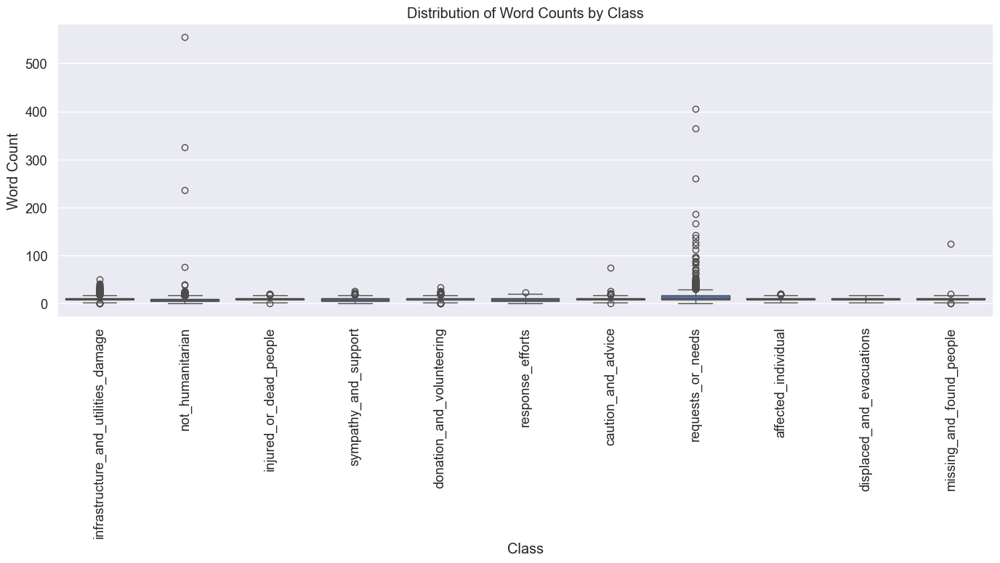


Statistical summary of word counts by class:
                                       count       mean        std  min  25%  \
class_label                                                                    
affected_individual                   3510.0   9.800570   2.953926  2.0  8.0   
caution_and_advice                    2990.0  10.005017   3.349544  1.0  8.0   
displaced_and_evacuations              510.0  10.209804   2.699251  3.0  8.0   
donation_and_volunteering             7388.0   9.659583   2.865111  0.0  8.0   
infrastructure_and_utilities_damage   5050.0  10.334455   4.256578  1.0  8.0   
injured_or_dead_people                2773.0   9.686982   2.894882  1.0  8.0   
missing_and_found_people               531.0  10.094162   5.855378  1.0  8.0   
not_humanitarian                     51584.0   7.487612   4.697359  0.0  5.0   
requests_or_needs                     6901.0  13.442689  11.317759  1.0  8.0   
response_efforts                      1114.0   8.938959   3.844443  1.0  6

In [19]:
print("\n" + "="*80)
print("2. TEXT VISUALIZATION")
print("="*80)

print("\n2.1 Word clouds for each class")

# Function to create word cloud
def create_word_cloud(text_series, title, filename):
    text = ' '.join([' '.join(tokens) for tokens in text_series])
    wordcloud = WordCloud(width=800, height=400, background_color='white',
                         max_words=100, contour_width=3, contour_color='steelblue')
    wordcloud.generate(text)

    plt.figure(figsize=(16, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=20)
    plt.tight_layout()
    plt.show()
    plt.close()

# Create word cloud for each top class
for cls in top_classes:
    # Get processed abstracts for this class
    class_docs = df_sample[df_sample[category_field] == cls][text_field_to_analyze]
    # Tokenize
    tokenized_docs = class_docs.apply(tokenize_processed_text)
    create_word_cloud(tokenized_docs, f'Word Cloud: {cls}', f'wordcloud_{cls}.png')
    print(f"  Created word cloud for {cls}")

print("\n2.2 n-gram frequency charts")

# Function to get n-grams
def get_ngrams(tokens_list, n=2, top_n=20):
    all_ngrams = []
    for tokens in tokens_list:
        if len(tokens) >= n:
            all_ngrams.extend([' '.join(gram) for gram in ngrams(tokens, n)])

    ngram_freq = Counter(all_ngrams)
    return ngram_freq.most_common(top_n)

# Get bigrams and trigrams
print("\nTop 20 most frequent bigrams:")
bigrams = get_ngrams(df_sample['tokens'], n=2)
for gram, count in bigrams:
    print(f"  {gram}: {count}")

print("\nTop 20 most frequent trigrams:")
trigrams = get_ngrams(df_sample['tokens'], n=3)
for gram, count in trigrams:
    print(f"  {gram}: {count}")

# Visualize n-grams
def plot_ngrams(ngrams, title, filename):
    labels, values = zip(*ngrams)
    plt.figure(figsize=(14, 8))
    plt.barh(range(len(labels)), values, align='center')
    plt.yticks(range(len(labels)), labels)
    plt.xlabel('Frequency')
    plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

plot_ngrams(bigrams, 'Top 20 Most Frequent Bigrams', 'top_bigrams.png')
plot_ngrams(trigrams, 'Top 20 Most Frequent Trigrams', 'top_trigrams.png')

print("\n2.3 Distribution of text lengths by class")

# Calculate text lengths
df_sample['word_count'] = df_sample['tokens'].apply(len)

# Visualize text length distribution by class
plt.figure(figsize=(14, 8))
sns.boxplot(x=category_field, y='word_count', data=df_sample)
plt.title('Distribution of Word Counts by Class')
plt.xlabel('Class')
plt.ylabel('Word Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()
plt.close()

# Statistical summary of text lengths by class
print("\nStatistical summary of word counts by class:")
word_count_stats = df_sample.groupby(category_field)['word_count'].describe()
print(word_count_stats)

# 3. LINGUISTIC ANALYSIS


3. LINGUISTIC ANALYSIS

3.1 Parts-of-speech distributions

Calculating POS distributions...

Parts of speech distribution:
  Nouns: 2399 (57.59%)
  Adjectives: 756 (18.15%)
  Verbs: 704 (16.90%)
  Adverbs: 164 (3.94%)
  Prepositions: 63 (1.51%)
  Other: 38 (0.91%)
  Numbers: 29 (0.70%)
  Determiners: 6 (0.14%)
  Pronouns: 5 (0.12%)
  Conjunctions: 2 (0.05%)


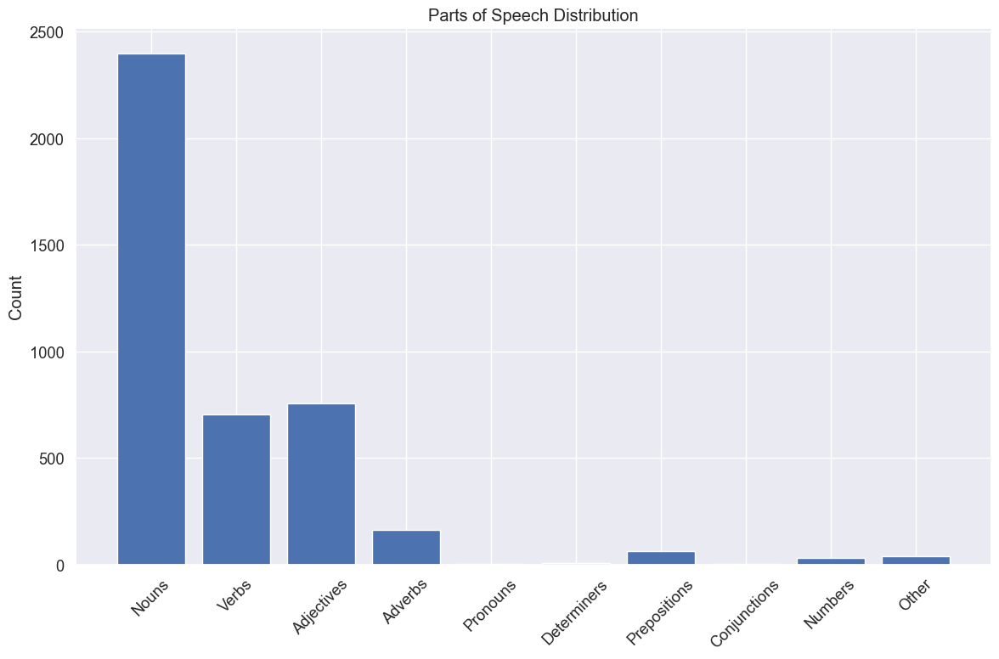

<Figure size 1600x1000 with 0 Axes>

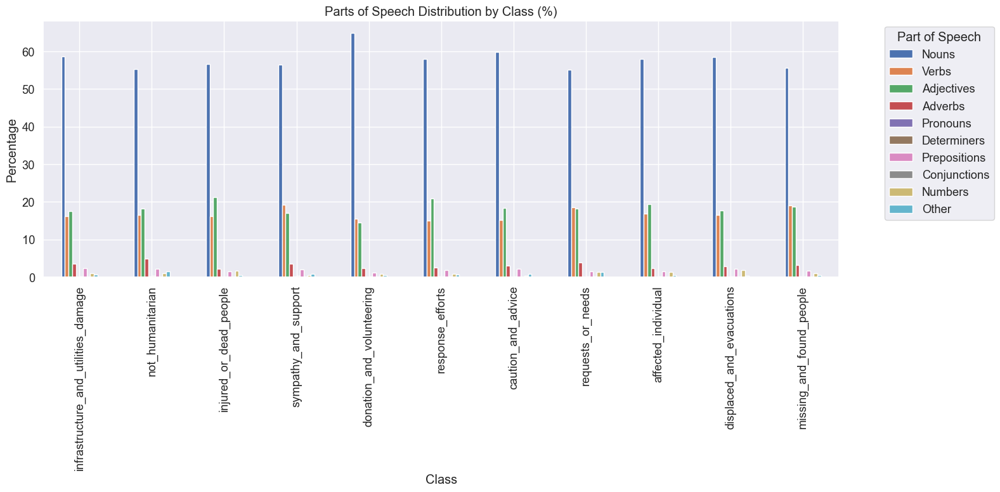

In [20]:
print("\n" + "="*80)
print("3. LINGUISTIC ANALYSIS")
print("="*80)

print("\n3.1 Parts-of-speech distributions")

# Function to get POS tags
def get_pos_tags(tokens_list, sample_size=500):
    # Take a random sample to improve performance
    if len(tokens_list) > sample_size:
        sampled_tokens = tokens_list.sample(sample_size, random_state=42)
    else:
        sampled_tokens = tokens_list

    pos_counts = Counter()
    for tokens in sampled_tokens:
        # Skip empty token lists
        if not tokens:
            continue

        # Get POS tags for the tokens
        tagged = pos_tag(tokens)
        pos_counts.update([tag for _, tag in tagged])

    return pos_counts

# Get POS distribution for the overall dataset
print("\nCalculating POS distributions...")
pos_counts = get_pos_tags(df_sample['tokens'])

# Group similar POS tags for better visualization
pos_groups = {
    'Nouns': ['NN', 'NNS', 'NNP', 'NNPS'],
    'Verbs': ['VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'],
    'Adjectives': ['JJ', 'JJR', 'JJS'],
    'Adverbs': ['RB', 'RBR', 'RBS'],
    'Pronouns': ['PRP', 'PRP$', 'WP', 'WP$'],
    'Determiners': ['DT', 'PDT', 'WDT'],
    'Prepositions': ['IN'],
    'Conjunctions': ['CC'],
    'Numbers': ['CD'],
    'Other': ['FW', 'LS', 'MD', 'RP', 'SYM', 'TO', 'UH', 'EX']
}

grouped_pos_counts = {}
for group, tags in pos_groups.items():
    grouped_pos_counts[group] = sum(pos_counts[tag] for tag in tags)

# Print POS distribution
print("\nParts of speech distribution:")
for group, count in sorted(grouped_pos_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"  {group}: {count} ({100 * count / sum(grouped_pos_counts.values()):.2f}%)")

# Visualize POS distribution
plt.figure(figsize=(12, 8))
plt.bar(grouped_pos_counts.keys(), grouped_pos_counts.values())
plt.title('Parts of Speech Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
plt.close()

# Compare POS distribution across classes
class_pos = {}
for cls in top_classes:
    class_tokens = df_sample[df_sample[category_field] == cls]['tokens']
    class_pos[cls] = get_pos_tags(class_tokens)

# Normalize and organize POS data for visualization
pos_by_class = pd.DataFrame(index=top_classes)
for group, tags in pos_groups.items():
    group_counts = []
    for cls in top_classes:
        count = sum(class_pos[cls][tag] for tag in tags)
        # Normalize by total counts in this class
        total = sum(class_pos[cls].values())
        group_counts.append(100 * count / total if total > 0 else 0)

    pos_by_class[group] = group_counts

# Visualize POS comparison
plt.figure(figsize=(16, 10))
pos_by_class.plot(kind='bar', figsize=(16, 8))
plt.title('Parts of Speech Distribution by Class (%)')
plt.xlabel('Class')
plt.ylabel('Percentage')
plt.legend(title='Part of Speech', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
plt.close()

# 4. SEMANTIC EXPLORATION


4. SEMANTIC EXPLORATION

4.1 Semantic similarity analysis

Creating document vectors using TF-IDF...
Calculating document similarity...

Semantic similarity results:
  Average within-class similarity: 0.0145
  Average between-class similarity: 0.0106
  Ratio (within/between): 1.3773


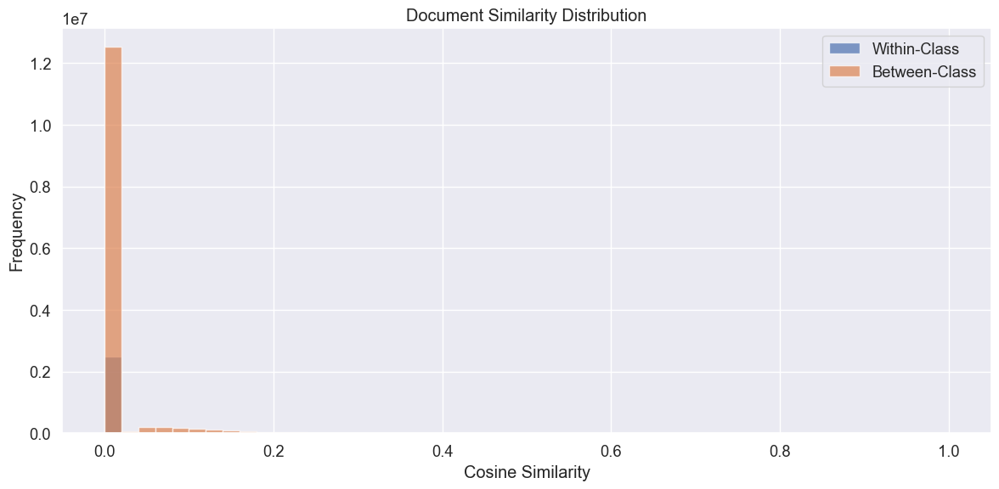

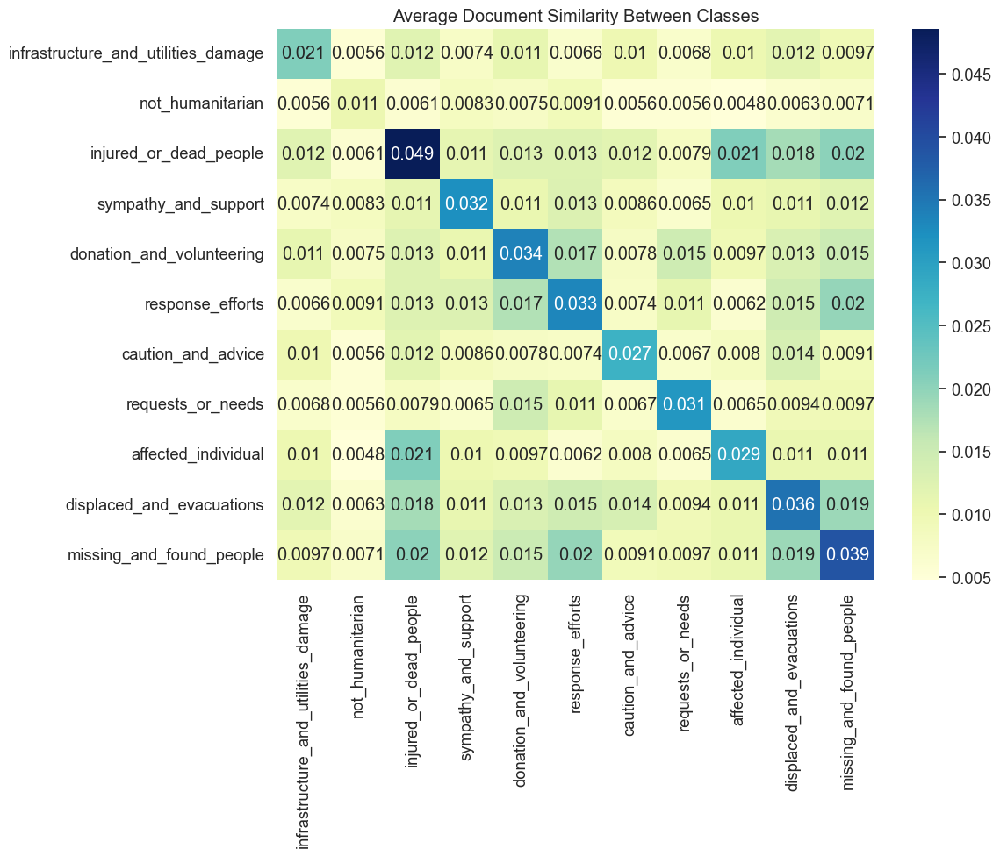

In [21]:
print("\n" + "="*80)
print("4. SEMANTIC EXPLORATION")
print("="*80)

print("\n4.1 Semantic similarity analysis")

# Use TF-IDF to create document vectors
print("\nCreating document vectors using TF-IDF...")
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set maximum samples per class to control memory usage
MAX_SAMPLES_PER_CLASS = 500

# Fill NA values
df_sample[text_field_to_analyze] = df_sample[text_field_to_analyze].fillna('')

# Create a controlled sample for analysis
controlled_sample_indices = []
class_to_sample_indices = {}

# Sample each class evenly
for cls in top_classes:
    # Get indices for this class
    cls_indices = df_sample[df_sample[category_field] == cls].index.tolist()
    # Take up to MAX_SAMPLES_PER_CLASS samples per class
    if len(cls_indices) > MAX_SAMPLES_PER_CLASS:
        sampled_indices = np.random.choice(cls_indices, MAX_SAMPLES_PER_CLASS, replace=False).tolist()
    else:
        sampled_indices = cls_indices

    # Store indices for this class
    class_to_sample_indices[cls] = sampled_indices
    controlled_sample_indices.extend(sampled_indices)

# Create a new DataFrame with just the controlled sample
controlled_df = df_sample.loc[controlled_sample_indices].copy()

# Create TF-IDF vectors for the controlled sample
tfidf_vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(controlled_df[text_field_to_analyze])

# Calculate document similarity using linear_kernel (more efficient for sparse matrices)
print("Calculating document similarity...")
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Prepare to track within-class and between-class similarities
within_class_sim = []
between_class_sim = []

# Create a lookup from original index to position in controlled sample
sample_position_lookup = {idx: pos for pos, idx in enumerate(controlled_df.index)}

# Track index positions for each class in the similarity matrix
class_indices = {}
for cls in top_classes:
    # Get original indices for this class
    original_indices = class_to_sample_indices[cls]
    # Convert to positions in the similarity matrix
    adjusted_indices = [sample_position_lookup[idx] for idx in original_indices]
    class_indices[cls] = adjusted_indices

# Calculate within-class similarity
for cls, indices in class_indices.items():
    if len(indices) > 1:  # Need at least 2 documents
        # Get similarity matrix for just this class
        class_sim = cosine_sim[np.ix_(indices, indices)]
        # Get upper triangle (excluding diagonal)
        upper_tri = np.triu(class_sim, k=1)
        # Store all similarity values
        within_class_sim.extend(upper_tri.flatten())

# Calculate between-class similarity
for i, (cls1, indices1) in enumerate(class_indices.items()):
    for cls2, indices2 in list(class_indices.items())[i+1:]:
        # Get cross-similarity between classes
        cross_sim = cosine_sim[np.ix_(indices1, indices2)]
        # Store all similarity values
        between_class_sim.extend(cross_sim.flatten())

# Summarize results
print("\nSemantic similarity results:")
print(f"  Average within-class similarity: {np.mean(within_class_sim):.4f}")
print(f"  Average between-class similarity: {np.mean(between_class_sim):.4f}")
print(f"  Ratio (within/between): {np.mean(within_class_sim)/np.mean(between_class_sim):.4f}")

# Visualize similarity distribution
plt.figure(figsize=(12, 6))
plt.hist(within_class_sim, bins=50, alpha=0.7, label='Within-Class')
plt.hist(between_class_sim, bins=50, alpha=0.7, label='Between-Class')
plt.title('Document Similarity Distribution')
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()
plt.close()

# Create a similarity heatmap for top classes
class_avg_sim = pd.DataFrame(index=top_classes, columns=top_classes, dtype=float)
class_avg_sim.fillna(0.0, inplace=True)  # Initialize with zeros

for i, cls1 in enumerate(top_classes):
    for j, cls2 in enumerate(top_classes):
        indices1 = class_indices.get(cls1, [])
        indices2 = class_indices.get(cls2, [])

        if indices1 and indices2:  # Check if not empty
            cross_sim = cosine_sim[np.ix_(indices1, indices2)]
            sim_value = float(np.mean(cross_sim))
            class_avg_sim.loc[cls1, cls2] = sim_value

# Ensure all values are numeric
class_avg_sim = class_avg_sim.astype(float)

# Visualize class similarity
plt.figure(figsize=(12, 10))
sns.heatmap(class_avg_sim, annot=True, cmap='YlGnBu')
plt.title('Average Document Similarity Between Classes')
plt.tight_layout()
plt.show()
plt.close()

# 5. FEATURE CORRELATION


5. FEATURE CORRELATION

5.1 Statistical relationship between text features and classes

Creating document-term matrix...

Top 20 most discriminative terms across classes:
          Term    Chi-Square  p-value
20        food  14362.327342      0.0
14       death  11563.735691      0.0
13        dead  10957.260331      0.0
87        toll  10286.894649      0.0
31        help   9806.828065      0.0
94       water   8947.240556      0.0
11      damage   8477.398229      0.0
39      killed   8279.236093      0.0
67      relief   8051.517455      0.0
62      prayer   7198.387698      0.0
92      victim   5431.818859      0.0
84     thought   5182.849897      0.0
50        need   5168.440235      0.0
88     tornado   5034.741906      0.0
19       flood   5031.261219      0.0
17  earthquake   4988.433799      0.0
37       india   4639.091149      0.0
6        chile   4488.818380      0.0
51       nepal   4166.546669      0.0
1          aid   3951.132072      0.0


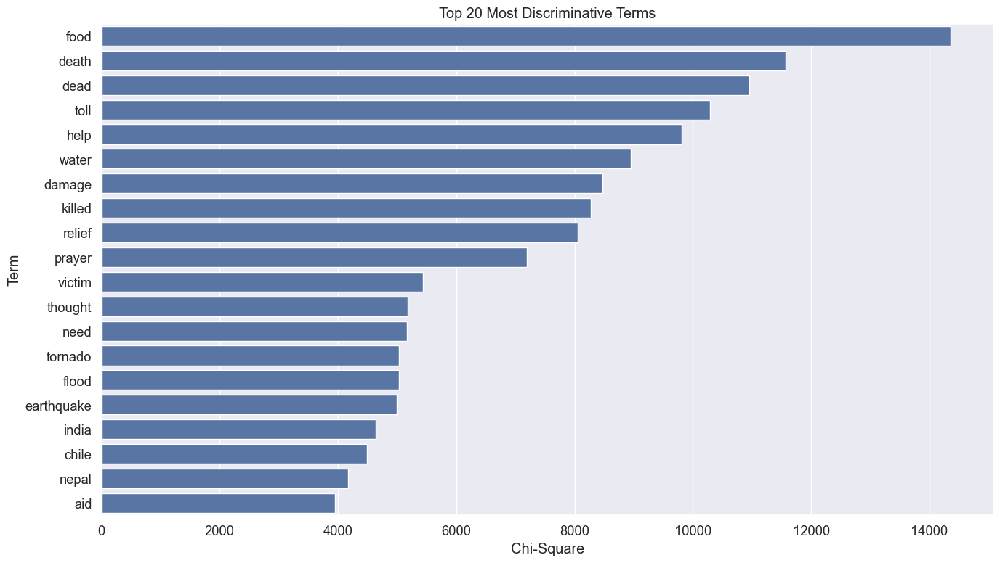


5.2 Feature importance preliminary assessment

Calculating class-specific term frequencies...

Most characteristic terms for each class:

  infrastructure_and_utilities_damage:
    damage: 18.61x more frequent than in other classes
    power: 11.46x more frequent than in other classes
    house: 5.55x more frequent than in other classes
    irma: 4.16x more frequent than in other classes
    home: 3.09x more frequent than in other classes
    california: 3.06x more frequent than in other classes
    hurricane: 2.82x more frequent than in other classes
    school: 2.81x more frequent than in other classes
    said: 2.62x more frequent than in other classes
    harvey: 2.62x more frequent than in other classes

  not_humanitarian:
    lol: 42.09x more frequent than in other classes
    think: 6.54x more frequent than in other classes
    love: 5.55x more frequent than in other classes
    na: 5.05x more frequent than in other classes
    got: 4.38x more frequent than in other classes
  

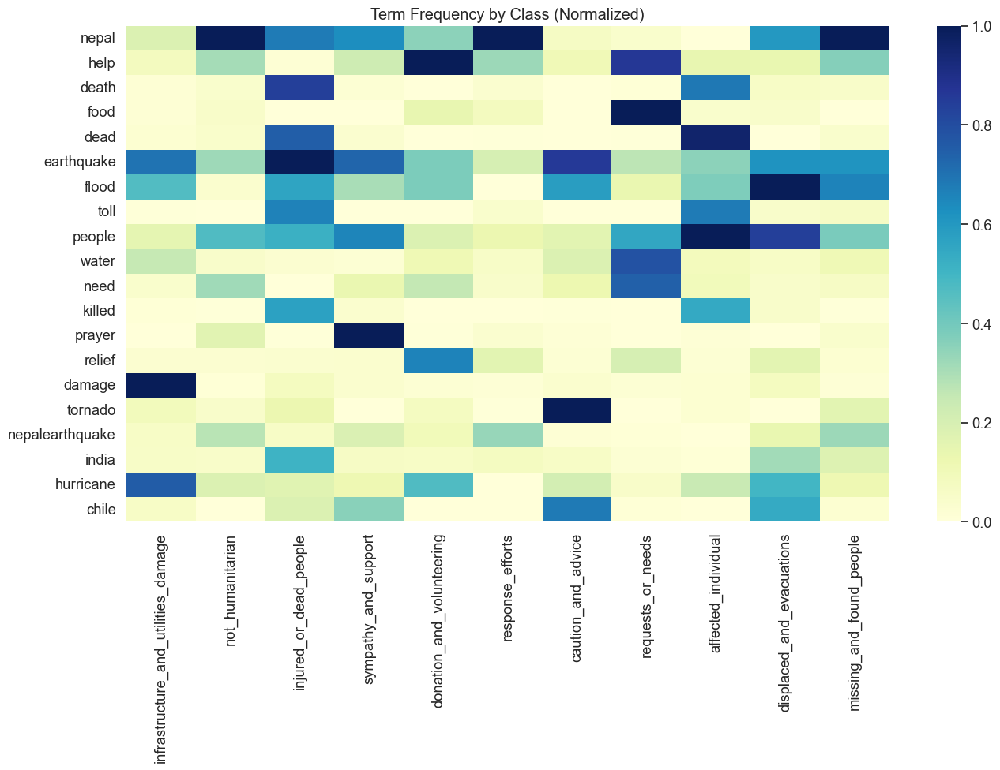

In [22]:
print("\n" + "="*80)
print("5. FEATURE CORRELATION")
print("="*80)

print("\n5.1 Statistical relationship between text features and classes")

# Create a document-term matrix for feature analysis
print("\nCreating document-term matrix...")
count_vectorizer = CountVectorizer(max_features=100, stop_words='english')
dtm = count_vectorizer.fit_transform(df_sample[text_field_to_analyze])
terms = count_vectorizer.get_feature_names_out()

# Convert to DataFrame for easier analysis
dtm_df = pd.DataFrame(dtm.toarray(), columns=terms)
dtm_df[category_field] = df_sample[category_field].values

# Calculate chi-square statistics for each term
from sklearn.feature_selection import chi2

# Prepare term frequency matrix (X) and target variable (y)
X = dtm_df.drop(category_field, axis=1).values
y = dtm_df[category_field].values

# Calculate chi-square statistics
chi2_values, p_values = chi2(X, y)

# Create a DataFrame to store results
feature_importance = pd.DataFrame({
    'Term': terms,
    'Chi-Square': chi2_values,
    'p-value': p_values
})

# Sort by chi-square value
feature_importance = feature_importance.sort_values('Chi-Square', ascending=False)

# Print top discriminative terms
print("\nTop 20 most discriminative terms across classes:")
print(feature_importance.head(20))

# Visualize top discriminative terms
plt.figure(figsize=(14, 8))
sns.barplot(x='Chi-Square', y='Term', data=feature_importance.head(20))
plt.title('Top 20 Most Discriminative Terms')
plt.tight_layout()
plt.show()
plt.close()

print("\n5.2 Feature importance preliminary assessment")

# Calculate class-specific term frequencies
print("\nCalculating class-specific term frequencies...")

# Create a DataFrame to store term frequency by class
term_freq_by_class = pd.DataFrame(index=terms)

for cls in top_classes:
    # Get indices for this class
    class_indices = dtm_df[dtm_df[category_field] == cls].index.tolist()
    # Calculate mean term frequency in this class
    class_freq = dtm_df.iloc[class_indices].drop(category_field, axis=1).mean()
    term_freq_by_class[cls] = class_freq

# Identify most characteristic terms for each class
print("\nMost characteristic terms for each class:")
for cls in top_classes:
    # Get terms with highest relative frequency in this class
    relative_freq = term_freq_by_class[cls] / term_freq_by_class.drop(cls, axis=1).mean(axis=1)
    top_terms = relative_freq.sort_values(ascending=False).head(10)

    print(f"\n  {cls}:")
    for term, score in top_terms.items():
        print(f"    {term}: {score:.2f}x more frequent than in other classes")

# Create heatmap of term frequency by class
term_freq_heatmap = term_freq_by_class.copy()

# Select top terms based on variance across classes
term_variance = term_freq_by_class.var(axis=1)
top_variable_terms = term_variance.sort_values(ascending=False).head(20).index.tolist()

# Create heatmap with only the most variable terms
term_freq_heatmap = term_freq_heatmap.loc[top_variable_terms]

# Scale the data for better visualization
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
heatmap_data = pd.DataFrame(
    scaler.fit_transform(term_freq_heatmap),
    index=term_freq_heatmap.index,
    columns=term_freq_heatmap.columns
)

# Create heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=False, cmap='YlGnBu')
plt.title('Term Frequency by Class (Normalized)')
plt.tight_layout()
plt.show()
plt.close()

# 6. ADVANCED VISUALIZATIONS


6. ADVANCED VISUALIZATIONS

6.1 t-SNE or PCA of document embeddings

Creating document embeddings...
Applying SVD...
Applying t-SNE...
Applying PCA...


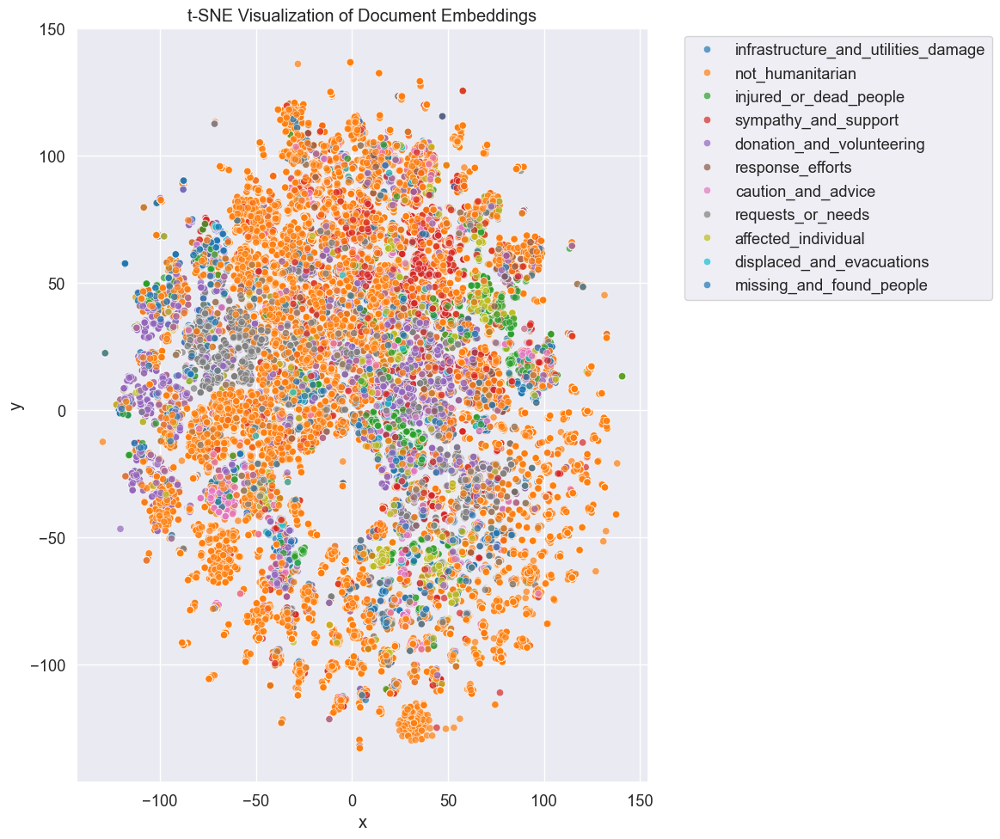

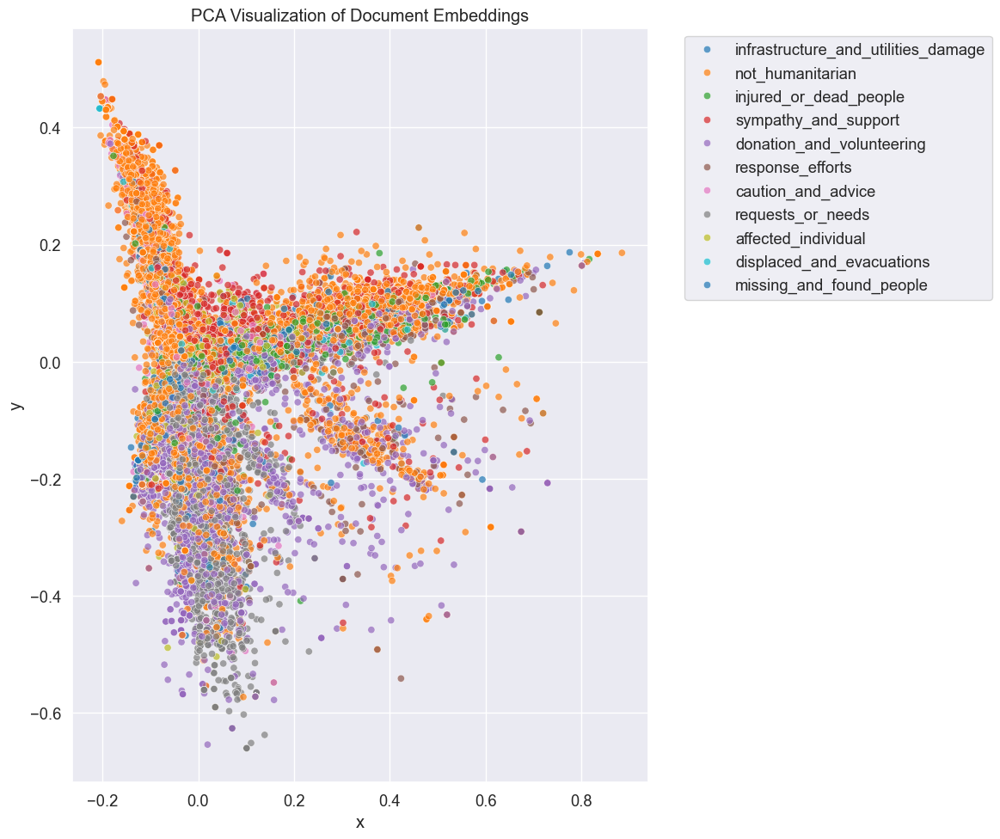


Variance explained by first two PCA components: 8.37%

6.2 Hierarchical clustering dendrograms

Sampling 1000 documents for hierarchical clustering...
Performing hierarchical clustering on 994 documents...


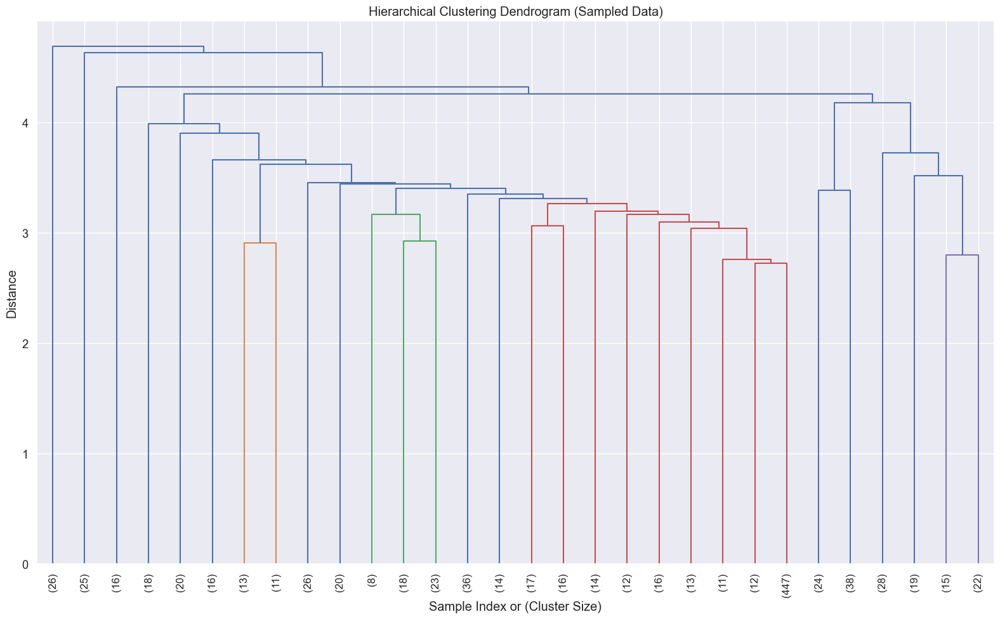

Clustering documents into 11 clusters...


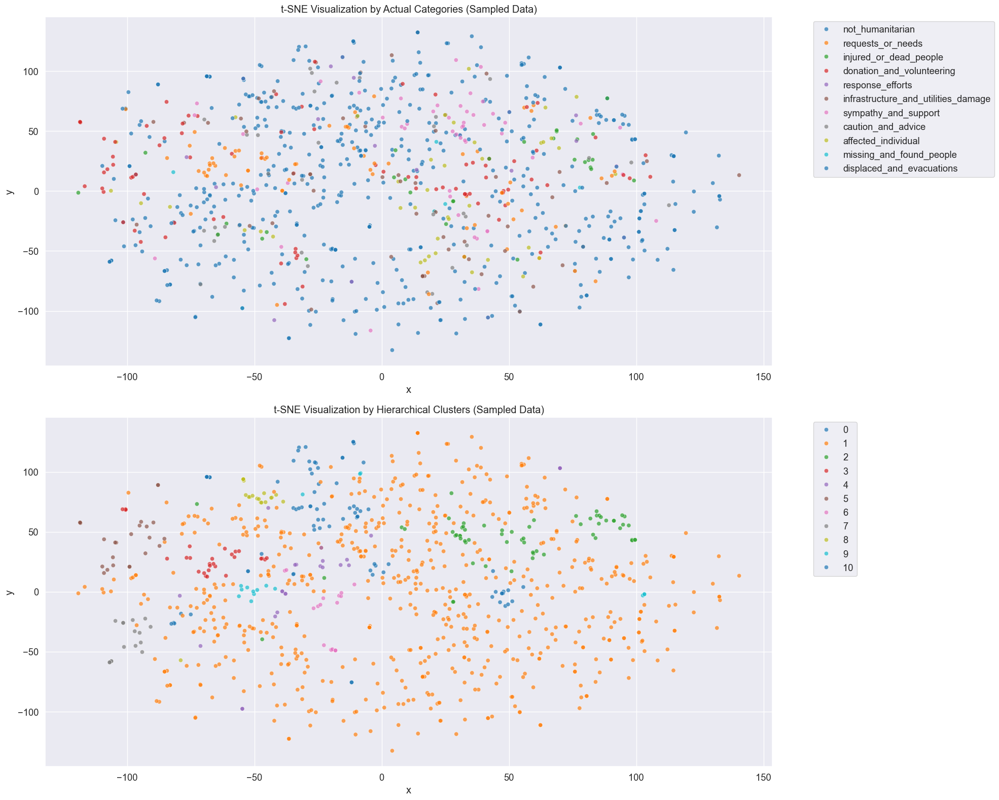


Cluster purity (sampled data): 0.6137


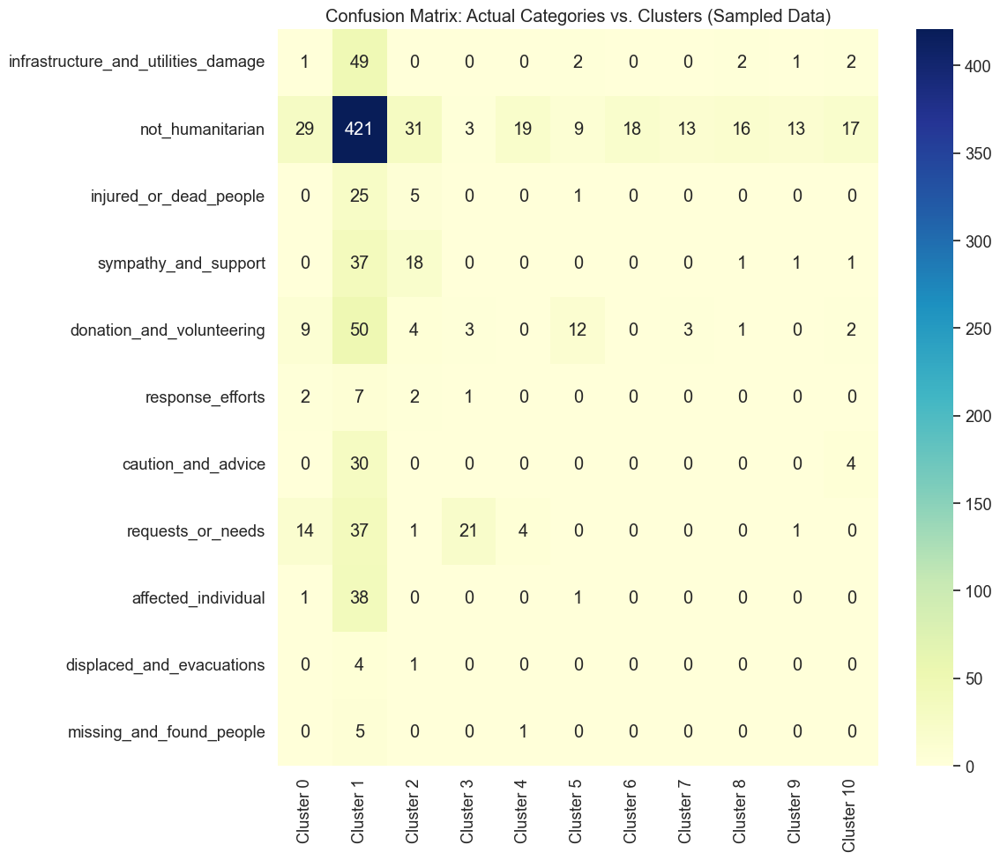

In [23]:
print("\n" + "="*80)
print("6. ADVANCED VISUALIZATIONS")
print("="*80)

print("\n6.1 t-SNE or PCA of document embeddings")

# Fill NaN values with empty strings
print("\nCreating document embeddings...")
df_sample[text_field_to_analyze] = df_sample[text_field_to_analyze].fillna('')

# Create document embeddings
tfidf_vectorizer = TfidfVectorizer(max_features=300, stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(df_sample[text_field_to_analyze])

# Apply dimensionality reduction
# First reduce dimensions with SVD (faster than applying t-SNE directly to high-dim data)
print("Applying SVD...")
svd = TruncatedSVD(n_components=50, random_state=42)
svd_embeddings = svd.fit_transform(tfidf_matrix)

# Apply t-SNE on SVD embeddings
print("Applying t-SNE...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_embeddings = tsne.fit_transform(svd_embeddings)

# Apply PCA
print("Applying PCA...")
pca = PCA(n_components=2, random_state=42)
pca_embeddings = pca.fit_transform(svd_embeddings)

# Create dataframes for visualization
tsne_df = pd.DataFrame({
    'x': tsne_embeddings[:, 0],
    'y': tsne_embeddings[:, 1],
    category_field: df_sample[category_field].values
})

pca_df = pd.DataFrame({
    'x': pca_embeddings[:, 0],
    'y': pca_embeddings[:, 1],
    category_field: df_sample[category_field].values
})

# Visualize t-SNE embeddings
plt.figure(figsize=(12, 10))
sns.scatterplot(x='x', y='y', hue=category_field, data=tsne_df, palette='tab10', alpha=0.7)
plt.title('t-SNE Visualization of Document Embeddings')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
plt.close()

# Visualize PCA embeddings
plt.figure(figsize=(12, 10))
sns.scatterplot(x='x', y='y', hue=category_field, data=pca_df, palette='tab10', alpha=0.7)
plt.title('PCA Visualization of Document Embeddings')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()
plt.close()

# Print variance explained by PCA
print(f"\nVariance explained by first two PCA components: {pca.explained_variance_ratio_.sum()*100:.2f}%")

print("\n6.2 Hierarchical clustering dendrograms")

# Sample a subset of documents for hierarchical clustering
max_docs_for_clustering = 1000  # Adjust based on available memory
print(f"\nSampling {max_docs_for_clustering} documents for hierarchical clustering...")

if svd_embeddings.shape[0] > max_docs_for_clustering:
    # Stratified sampling by category to maintain distribution
    sample_indices = []
    for category in top_classes:
        category_indices = df_sample[df_sample[category_field] == category].index
        # Convert to positions in the svd_embeddings array
        category_positions = [df_sample.index.get_loc(idx) for idx in category_indices]
        # Sample from each category proportionally
        n_samples = min(len(category_positions),
                         max(5, int(max_docs_for_clustering * len(category_positions) / len(df_sample))))
        sampled = np.random.choice(category_positions, size=n_samples, replace=False)
        sample_indices.extend(sampled)

    # Ensure we don't exceed the maximum
    if len(sample_indices) > max_docs_for_clustering:
        sample_indices = np.random.choice(sample_indices, size=max_docs_for_clustering, replace=False)

    # Extract the sampled features and categories
    sampled_features = svd_embeddings[sample_indices]
    sampled_categories = df_sample[category_field].iloc[sample_indices].values
else:
    sampled_features = svd_embeddings
    sampled_categories = df_sample[category_field].values

print(f"Performing hierarchical clustering on {len(sampled_features)} documents...")

# Calculate linkage matrix on the sample
linkage_matrix = linkage(sampled_features, method='ward')

# Draw dendrogram
plt.figure(figsize=(16, 10))
dendrogram(
    linkage_matrix,
    truncate_mode='lastp',  # Show only the last p merged clusters
    p=30,  # Show only 30 nodes
    leaf_rotation=90.,
    leaf_font_size=12.
)
plt.title('Hierarchical Clustering Dendrogram (Sampled Data)')
plt.xlabel('Sample Index or (Cluster Size)')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()
plt.close()

# Perform clustering with specific number of clusters
n_clusters = len(top_classes)
print(f"Clustering documents into {n_clusters} clusters...")

# Apply hierarchical clustering on the sample
cluster_model = AgglomerativeClustering(n_clusters=n_clusters)
sample_clusters = cluster_model.fit_predict(sampled_features)

# For visualizing clusters on t-SNE, we need to match the indices
# Create a mapping from the original indices to clusters
sample_indices_set = set(sample_indices) if 'sample_indices' in locals() else set(range(len(df_sample)))

# Add cluster labels to the t-SNE visualization (only for sampled points)
tsne_cluster_df = tsne_df.copy()
tsne_cluster_df['cluster'] = -1  # Default for non-sampled points

# Assign clusters to the sampled points
for i, idx in enumerate(sample_indices) if 'sample_indices' in locals() else enumerate(range(len(df_sample))):
    if idx < len(tsne_cluster_df):
        tsne_cluster_df.iloc[idx, tsne_cluster_df.columns.get_loc('cluster')] = sample_clusters[i]

# Visualize only the sampled points with clusters
tsne_sampled_df = tsne_cluster_df[tsne_cluster_df['cluster'] >= 0]

# Visualize clusters on t-SNE plot
plt.figure(figsize=(20, 16))

# First subplot: colored by actual categories
plt.subplot(2, 1, 1)
sns.scatterplot(x='x', y='y', hue=category_field, data=tsne_sampled_df, palette='tab10', alpha=0.7)
plt.title('t-SNE Visualization by Actual Categories (Sampled Data)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Second subplot: colored by predicted clusters
plt.subplot(2, 1, 2)
sns.scatterplot(x='x', y='y', hue='cluster', data=tsne_sampled_df, palette='tab10', alpha=0.7)
plt.title('t-SNE Visualization by Hierarchical Clusters (Sampled Data)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()
plt.close()

# Evaluate cluster purity for the sampled data
from sklearn.metrics import confusion_matrix

# Create confusion matrix between actual categories and predicted clusters
sampled_categories_idx = [list(top_classes).index(cat) for cat in tsne_sampled_df[category_field]]
conf_matrix = confusion_matrix(sampled_categories_idx, tsne_sampled_df['cluster'])

# Calculate purity
cluster_to_class = {}
for i in range(n_clusters):
    if i in tsne_sampled_df['cluster'].values:
        cluster_col = conf_matrix[:, i] if i < conf_matrix.shape[1] else np.zeros(len(top_classes))
        cluster_to_class[i] = np.argmax(cluster_col)

correct_assignments = 0
for i, row in tsne_sampled_df.iterrows():
    true_class_idx = list(top_classes).index(row[category_field])
    if row['cluster'] in cluster_to_class and cluster_to_class[row['cluster']] == true_class_idx:
        correct_assignments += 1

purity = correct_assignments / len(tsne_sampled_df)
print(f"\nCluster purity (sampled data): {purity:.4f}")

# Create confusion matrix visualization
plt.figure(figsize=(12, 10))
conf_df = pd.DataFrame(conf_matrix, index=top_classes,
                      columns=[f"Cluster {i}" for i in range(min(n_clusters, conf_matrix.shape[1]))])
sns.heatmap(conf_df, annot=True, cmap='YlGnBu', fmt='d')
plt.title('Confusion Matrix: Actual Categories vs. Clusters (Sampled Data)')
plt.tight_layout()
plt.show()
plt.close()

# 7. EDA SUMMARY

In [24]:
print("\n" + "="*80)
print("7. EDA SUMMARY")
print("="*80)

print("\nKey findings from exploratory data analysis:")

# Vocabulary findings
print("\nVocabulary Analysis:")
print(f"- Total unique words in sample: {len(set(word for tokens in df_sample['tokens'] for word in tokens))}")
print(f"- Average words per document: {df_sample['tokens'].apply(len).mean():.1f}")
print("- Class vocabulary overlap ranges from " +
      f"{overlap_matrix.values.min():.2f} to {overlap_matrix.values.max():.2f} (Jaccard similarity)")
print(f"- Most distinctive class by unique vocabulary: {max(unique_word_counts.items(), key=lambda x: x[1])[0]}")

# Text features
print("\nText Features:")
print(f"- Most common words overall: {', '.join(word for word, _ in overall_word_freq[:5])}")
print(f"- Most common bigram: {bigrams[0][0]} ({bigrams[0][1]} occurrences)")
print(f"- Most common trigram: {trigrams[0][0]} ({trigrams[0][1]} occurrences)")
print(f"- Class with longest documents: {word_count_stats['mean'].idxmax()} (avg: {word_count_stats['mean'].max():.1f} words)")
print(f"- Class with shortest documents: {word_count_stats['mean'].idxmin()} (avg: {word_count_stats['mean'].min():.1f} words)")

# Linguistic patterns
print("\nLinguistic Patterns:")
print(f"- Most frequent part of speech: {max(grouped_pos_counts.items(), key=lambda x: x[1])[0]}")
pos_class_diff = (pos_by_class.max() - pos_by_class.min()).idxmax()
print(f"- Part of speech with greatest class variation: {pos_class_diff}")

# Semantic patterns
print("\nSemantic Patterns:")
print(f"- Within-class similarity is {np.mean(within_class_sim)/np.mean(between_class_sim):.2f}x higher than between-class")
most_similar_classes = class_avg_sim.unstack().sort_values(ascending=False)
most_similar_pair = most_similar_classes.index[1]  # Skip diagonal (self-similarity)
print(f"- Most similar classes: {most_similar_pair[0]} and {most_similar_pair[1]} " +
      f"(similarity: {most_similar_classes.iloc[1]:.4f})")

# Clustering insights
print("\nClustering Insights:")
print(f"- Cluster purity: {purity:.4f}")
print(f"- Variance explained by first two PCA components: {pca.explained_variance_ratio_.sum()*100:.2f}%")


7. EDA SUMMARY

Key findings from exploratory data analysis:

Vocabulary Analysis:
- Total unique words in sample: 58409
- Average words per document: 8.7
- Class vocabulary overlap ranges from 0.03 to 1.00 (Jaccard similarity)
- Most distinctive class by unique vocabulary: not_humanitarian

Text Features:
- Most common words overall: nepal, earthquake, help, people, amp
- Most common bigram: puerto rico (1772 occurrences)
- Most common trigram: gt gt gt (297 occurrences)
- Class with longest documents: requests_or_needs (avg: 13.4 words)
- Class with shortest documents: not_humanitarian (avg: 7.5 words)

Linguistic Patterns:
- Most frequent part of speech: Nouns
- Part of speech with greatest class variation: Nouns

Semantic Patterns:
- Within-class similarity is 1.38x higher than between-class
- Most similar classes: missing_and_found_people and missing_and_found_people (similarity: 0.0390)

Clustering Insights:
- Cluster purity: 0.6137
- Variance explained by first two PCA componen